In [7]:
pip install matplotlib

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.2/155.2 kB 1.1 MB/s eta 0:00:00m eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 13.0 MB/s eta 0:00:00m eta 0:00:010:0101
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 310.7/310.7 kB 1.8 MB/s eta 0:00:000m eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 12.7 MB/s eta 0:00:00m eta 0:00:010:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 8.7 MB/s eta 0:00:000m eta 0:00:010:00:01
Note: you may need to restart the kernel to use updated packages.


In [1]:
import pandas as pd

In [2]:
url = 'https://github.com/mattharrison/datasets/raw/master/data/siena2018-pres.csv'

In [3]:
df = pd.read_csv(url, index_col=0)

In [4]:
def tweak_siena_pres(df):
    def int64_to_uint8(df_):
        cols = df_.select_dtypes('int64')
        return (df_
                .astype({col:'uint8' for col in cols}))


    return (df
     .rename(columns={'Seq.':'Seq'})    # 1
     .rename(columns={k:v.replace(' ', '_') for k,v in
        {'Bg': 'Background',
         'PL': 'Party leadership', 'CAb': 'Communication ability',
         'RC': 'Relations with Congress', 'CAp': 'Court appointments',
         'HE': 'Handling of economy', 'L': 'Luck',
         'AC': 'Ability to compromise', 'WR': 'Willing to take risks',
         'EAp': 'Executive appointments', 'OA': 'Overall ability',
         'Im': 'Imagination', 'DA': 'Domestic accomplishments',
         'Int': 'Integrity', 'EAb': 'Executive ability',
         'FPA': 'Foreign policy accomplishments',
         'LA': 'Leadership ability',
         'IQ': 'Intelligence', 'AM': 'Avoid crucial mistakes',
         'EV': "Experts' view", 'O': 'Overall'}.items()})
     .astype({'Party':'category'})  # 2
     .pipe(int64_to_uint8)  # 3
     .assign(Average_rank=lambda df_:(df_.select_dtypes('uint8') # 4
                 .sum(axis=1).rank(method='dense').astype('uint8')),
             Quartile=lambda df_:pd.qcut(df_.Average_rank, 4,
                 labels='1st 2nd 3rd 4th'.split())
            )
    )

In [5]:
pres = tweak_siena_pres(df)

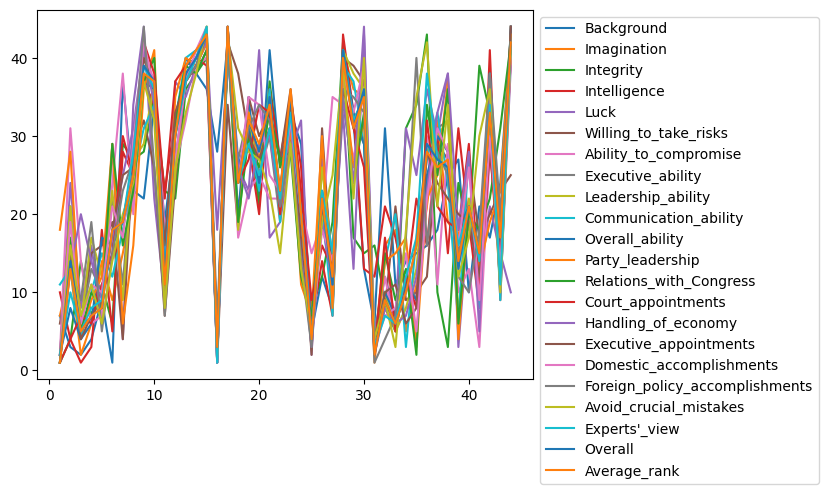

In [9]:
pres.plot().legend(bbox_to_anchor=(1,1));

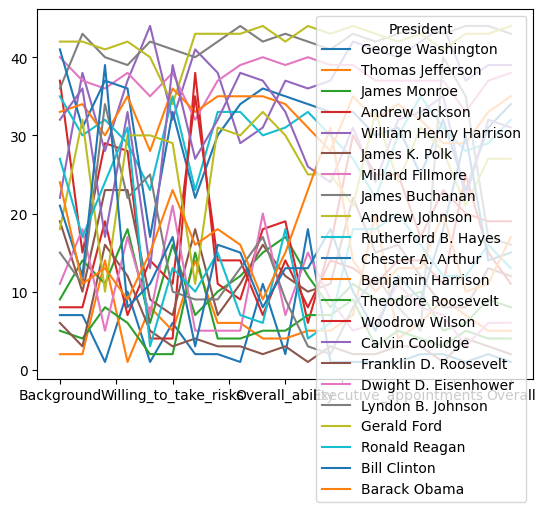

In [11]:
(pres
    .set_index('President')
    .loc[::2, 'Background':'Overall']
    .T
    .plot()
);

In [12]:
import matplotlib.pyplot as plt

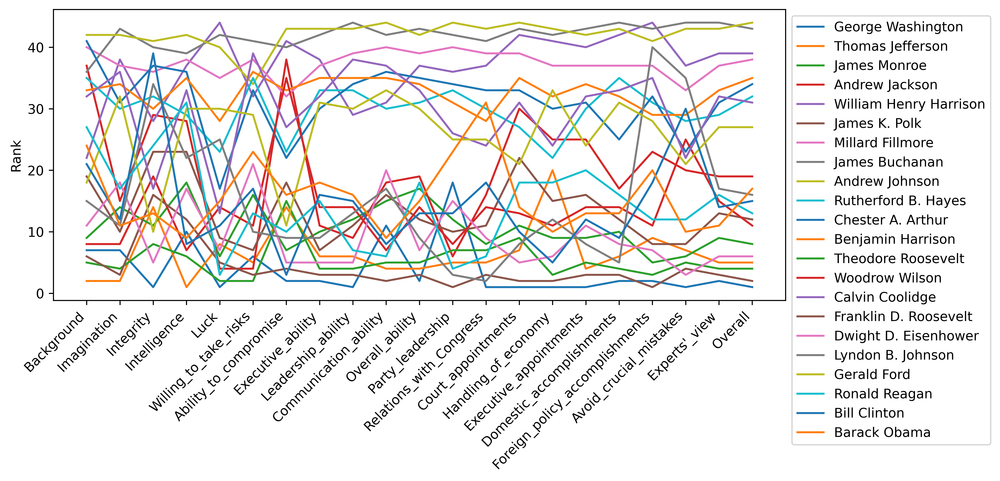

In [14]:
fig, ax = plt.subplots(dpi=600, figsize=(10,4))
(pres
    .set_index('President')
    .loc[::2,'Background':'Overall']
    .T
    .plot(ax=ax, rot=45).legend(bbox_to_anchor=(1,1))
)
ax.set_xticks(range(21))
ax.set_xticklabels(pres
                  .loc[:,'Background':'Overall'].columns, ha='right')
ax.set_ylabel('Rank');

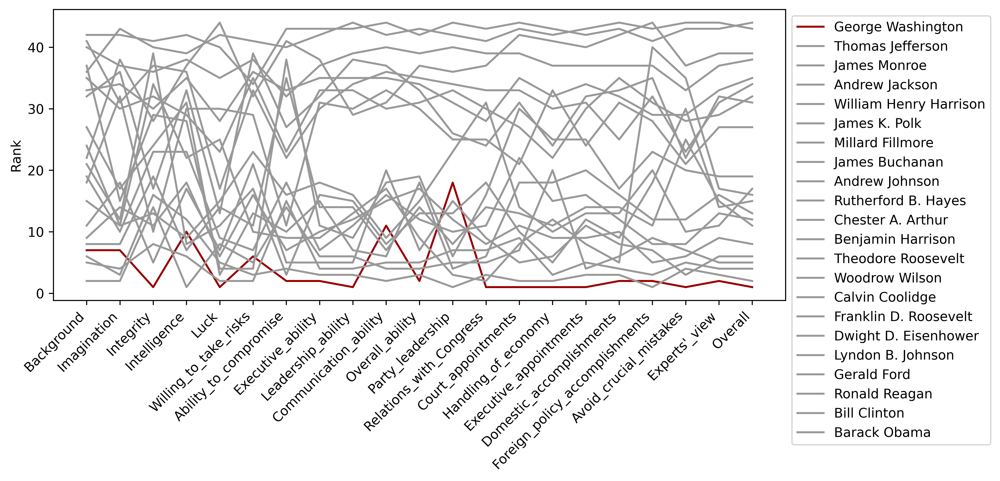

In [16]:
fig, ax = plt.subplots(dpi=600, figsize=(10,4))
colors = []
def set_colors(df):
    for col in df.columns:
        if 'George' in col:
            colors.append('#990000')
        else:
            colors.append('#999999')
    return df

(pres
    .set_index('President')
    .loc[::2,'Background':'Overall']
    .T
    .pipe(set_colors)
    .plot(ax=ax, rot=45, color=colors)
    .legend(bbox_to_anchor=(1,1))
)
ax.set_xticks(range(21))
ax.set_xticklabels(pres
                  .loc[:,'Background':'Overall'].columns, ha='right')
ax.set_ylabel('Rank');

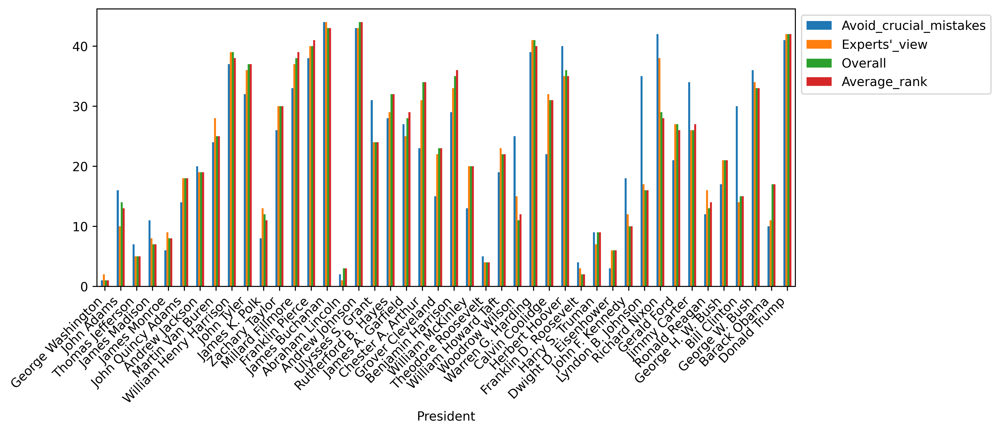

In [18]:
fig, ax = plt.subplots(dpi=600, figsize=(10,4))
(pres
    .set_index('President')
    .iloc[:, -5:-1]
    .plot.bar(rot=45, ax=ax)
)
ax.set_xticklabels(labels=ax.get_xticklabels(), ha='right')
ax.legend(bbox_to_anchor=(1,1));

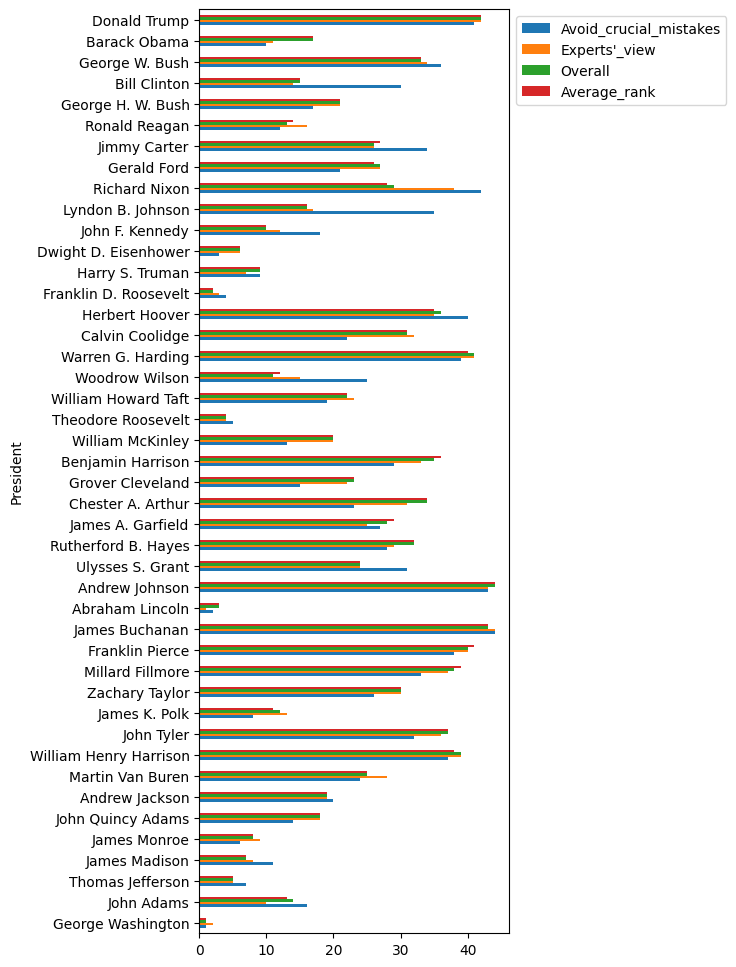

In [23]:
(pres
    .set_index('President')
    .iloc[:, -5:]
    .plot.barh(figsize=(4,12))
    .legend(bbox_to_anchor=(1,1))
);

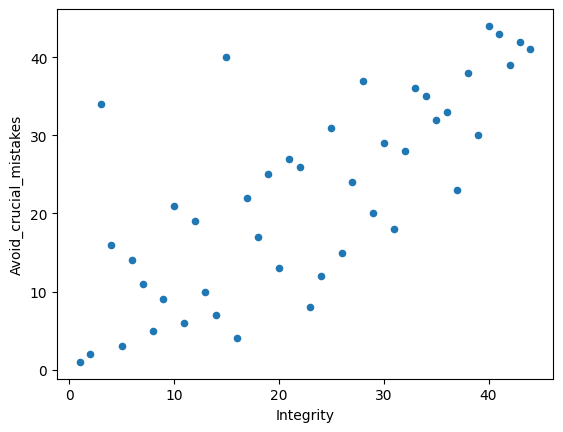

In [25]:
(pres
    .plot.scatter(x='Integrity', y='Avoid_crucial_mistakes')
);

In [26]:
pres.Integrity.corr(pres.Avoid_crucial_mistakes)

0.7455954897815362

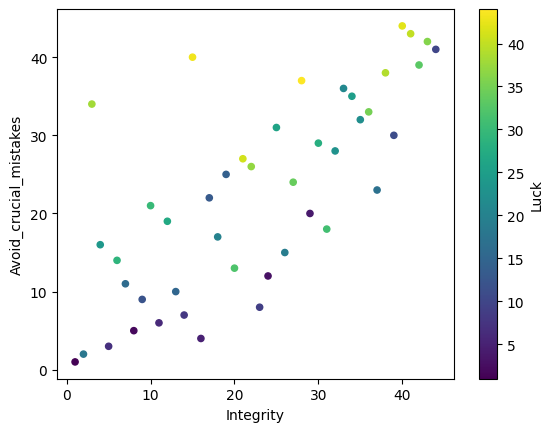

In [28]:
(pres
    .plot.scatter(x='Integrity', y='Avoid_crucial_mistakes', c='Luck', cmap='viridis')
);

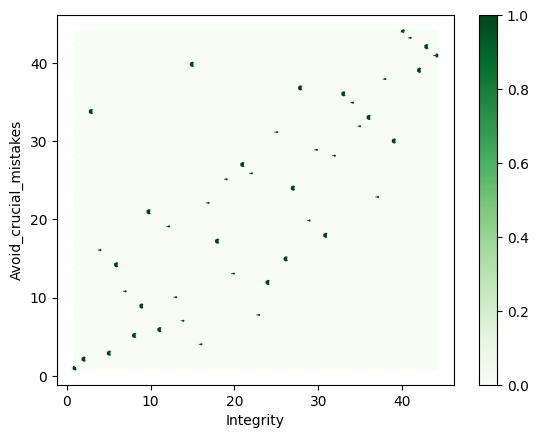

In [30]:
(pres
    .plot.hexbin(x='Integrity', y='Avoid_crucial_mistakes', cmap='Greens')
);

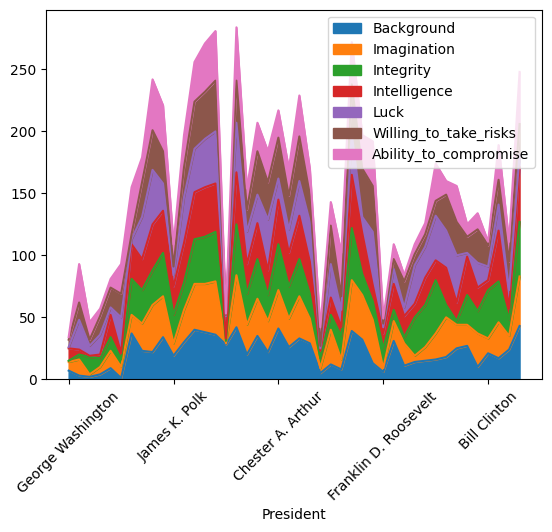

In [31]:
(pres
    .plot.area(x='President',
              y='Background Imagination Integrity Intelligence Luck '\
              'Willing_to_take_risks Ability_to_compromise'.split(),
              rot=45)
)
ax.set_xticks(range(len(pres)))
ax.set_xticklabels(labels=pres.President, ha='right');

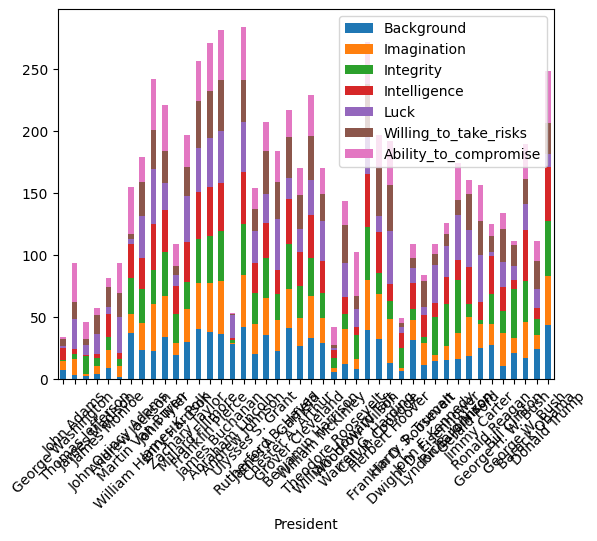

In [33]:
(pres
    .plot.bar(x='President',
             y='Background Imagination Integrity Intelligence Luck '\
             'Willing_to_take_risks Ability_to_compromise'.split(),
             rot=45, stacked=True)
)
ax.set_xticks(range(len(pres)))
ax.set_xticklabels(labels=pres.President, ha='right');

In [34]:
(pres
    .set_index('President')
    .loc[:, 'Background':'Average_rank']
    .iloc[:9]
    .T
    .describe()
)

President,George Washington,John Adams,Thomas Jefferson,James Madison,James Monroe,John Quincy Adams,Andrew Jackson,Martin Van Buren,William Henry Harrison
count,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000
mean,3.681818,14.454545,6.545455,9.636364,10.454545,17.181818,19.590909,25.681818,36.909091
std,4.444219,7.544959,4.404838,4.392043,3.634848,7.538071,9.465019,3.721064,5.485124
min,1.000000,3.000000,1.000000,3.000000,5.000000,1.000000,4.000000,16.000000,22.000000
25%,1.000000,10.750000,4.250000,6.250000,8.000000,14.250000,15.250000,24.250000,36.250000
50%,2.000000,13.500000,5.000000,8.500000,9.500000,18.000000,19.000000,25.500000,38.000000
75%,5.000000,18.500000,7.000000,12.500000,12.000000,21.750000,25.000000,27.750000,40.750000
max,18.000000,31.000000,20.000000,19.000000,18.000000,29.000000,38.000000,34.000000,44.000000


In [36]:
pip install scipy

Defaulting to user installation because normal site-packages is not writeable
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 339.3 kB/s eta 0:00:0031m1.1 MB/s eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 8.2 MB/s eta 0:00:000m eta 0:00:010:00:01
Note: you may need to restart the kernel to use updated packages.


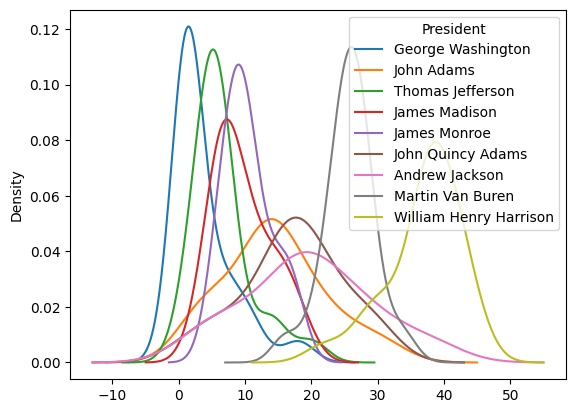

In [38]:
(pres
    .set_index('President')
    .loc[:,'Background':'Average_rank']
    .iloc[:9]
    .T
    .plot.density()
);

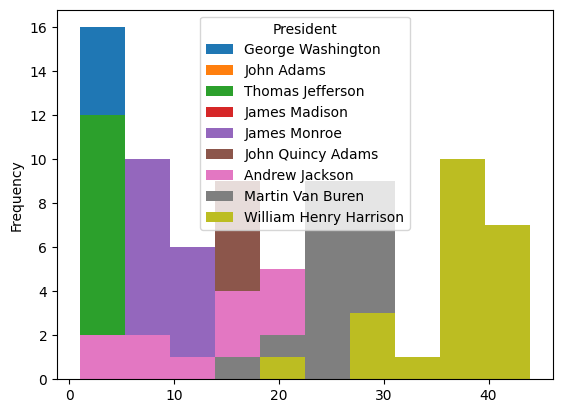

In [40]:
(pres
    .set_index('President')
    .loc[:,'Background':'Average_rank']
    .iloc[:9]
    .T
    .plot.hist()
);

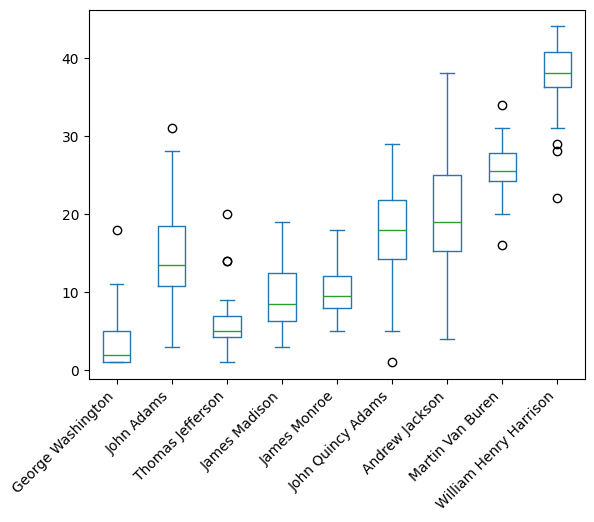

In [43]:
ax = (pres
     .set_index('President')
     .loc[:, 'Background':'Average_rank']
     .iloc[:9]
     .T
     .plot.box(rot=45)
)
ax.set_xticklabels(labels=(pres.President[:9]), ha='right');